In [ ]:
import pandas as pd
import sqlite3
import requests

In [ ]:
url = 'https://www.alphavantage.co/query?function=TIME_SERIES_INTRADAY&symbol=IBM&interval=1min&apikey=KYTHBB16J9JN4C5G&outputsize=full'

In [ ]:
r = requests.get(url)

In [ ]:
data = r.json()

In [ ]:
df = pd.DataFrame(data.get('Time Series (1min)'))

In [ ]:
print(df.T)

                      1. open   2. high    3. low  4. close 5. volume
2024-09-23 19:59:00  220.4900  220.4900  220.4700  220.4700       101
2024-09-23 19:57:00  220.4000  220.4800  220.4000  220.4800       177
2024-09-23 19:48:00  220.2500  220.2500  220.2500  220.2500         1
2024-09-23 19:47:00  220.4000  220.4000  220.4000  220.4000        21
2024-09-23 19:46:00  220.4000  220.4000  220.4000  220.4000         2
...                       ...       ...       ...       ...       ...
2024-08-26 04:08:00  196.2800  196.2800  196.2800  196.2800         1
2024-08-26 04:07:00  196.1200  196.1200  195.7500  196.1200        24
2024-08-26 04:06:00  196.0000  196.3800  196.0000  196.1000        31
2024-08-26 04:05:00  195.8000  195.8000  195.6800  195.6800       120
2024-08-26 04:01:00  196.2000  196.2000  196.0000  196.0000         6

[11173 rows x 5 columns]


In [ ]:
def fetch_intraday_data(ticker, interval='1min'):
  url = f'https://www.alphavantage.co/query?function=TIME_SERIES_INTRADAY&symbol={ticker}&interval={interval}&apikey=KYTHBB16J9JN4C5G&outputsize=full'
  response = requests.get(url)
  data = response.json()
  print(data)

  time_series = data.get(f'Time Series ({interval})', {})
  if not time_series:
    print(f'No data returned for ticker')
    return None
  df = pd.DataFrame(time_series).T
  df.index.name = 'timestamp'
  df.columns = ['open','close','high', 'low', 'volume']
  df.reset_index(inplace=True)
  df = df.sort_index()
  df['ticker'] = ticker
  return df

In [ ]:
df_ = fetch_intraday_data('IBM')

{'Meta Data': {'1. Information': 'Intraday (1min) open, high, low, close prices and volume', '2. Symbol': 'IBM', '3. Last Refreshed': '2024-09-23 19:59:00', '4. Interval': '1min', '5. Output Size': 'Full size', '6. Time Zone': 'US/Eastern'}, 'Time Series (1min)': {'2024-09-23 19:59:00': {'1. open': '220.4900', '2. high': '220.4900', '3. low': '220.4700', '4. close': '220.4700', '5. volume': '101'}, '2024-09-23 19:57:00': {'1. open': '220.4000', '2. high': '220.4800', '3. low': '220.4000', '4. close': '220.4800', '5. volume': '177'}, '2024-09-23 19:48:00': {'1. open': '220.2500', '2. high': '220.2500', '3. low': '220.2500', '4. close': '220.2500', '5. volume': '1'}, '2024-09-23 19:47:00': {'1. open': '220.4000', '2. high': '220.4000', '3. low': '220.4000', '4. close': '220.4000', '5. volume': '21'}, '2024-09-23 19:46:00': {'1. open': '220.4000', '2. high': '220.4000', '3. low': '220.4000', '4. close': '220.4000', '5. volume': '2'}, '2024-09-23 19:39:00': {'1. open': '220.3200', '2. high

In [ ]:
df_

,timestamp,open,close,high,low,volume,ticker
0,2024-09-23 19:59:00,220.4900,220.4900,220.4700,220.4700,101,IBM
1,2024-09-23 19:57:00,220.4000,220.4800,220.4000,220.4800,177,IBM
2,2024-09-23 19:48:00,220.2500,220.2500,220.2500,220.2500,1,IBM
3,2024-09-23 19:47:00,220.4000,220.4000,220.4000,220.4000,21,IBM
4,2024-09-23 19:46:00,220.4000,220.4000,220.4000,220.4000,2,IBM
...,...,...,...,...,...,...,...
11168,2024-08-26 04:08:00,196.2800,196.2800,196.2800,196.2800,1,IBM
11169,2024-08-26 04:07:00,196.1200,196.1200,195.7500,196.1200,24,IBM
11170,2024-08-26 04:06:00,196.0000,196.3800,196.0000,196.1000,31,IBM
11171,2024-08-26 04:05:00,195.8000,195.8000,195.6800,195.6800,120,IBM


<Axes: xlabel='timestamp'>

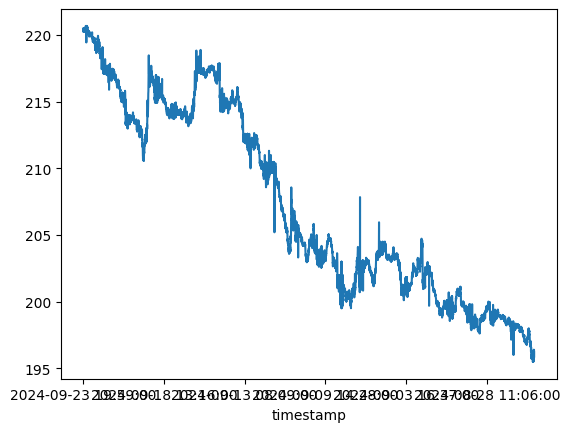

In [ ]:
df_.set_index('timestamp').close.astype(float).plot()

In [ ]:
conn = sqlite3.connect('intraday.db')

In [ ]:
cursor = conn.cursor()

In [ ]:
cursor.execute('''
CREATE TABLE IF NOT EXISTS intraday_prices(
ticker TEXT,
timestamp TEXT,
open REAL,
high REAL,
low REAL,
close REAL,
volume INTEGER
)
''')


In [ ]:
conn.commit()

In [ ]:
def get_latest_timestamp(ticker):
  query = f"""
  SELECT MAX(timestamp) FROM intraday_prices WHERE ticker='{ticker}'
  """
  cursor.execute(query)
  result = cursor.fetchone()[0]
  return result

In [ ]:
get_latest_timestamp('IBM')

'2024-09-23 19:59:00'

In [ ]:
def store_data_to_db(data, latest_timestamp):
  if data is not None:
    if latest_timestamp:
      data = data[data['timestamp'] > latest_timestamp]

    if not data.empty:
      data.to_sql('intraday_prices', conn, if_exists='append', index=False)
      print(f"Data for {data['ticker'].iloc[0]} stored successfully ")

    else:
      print("no new data to store")

    #data.to_sql('intraday_prices', conn, if_exists='append', index=False)
  else:
    print("no data to store")


In [ ]:
from logging import lastResort
def main():
  tickers = ['IBM', 'AAPL', 'MSFT', 'GOOGL']
  for ticker in tickers:
    latest_timestamp = get_latest_timestamp(ticker)
    data = fetch_intraday_data(ticker)
    store_data_to_db(data, latest_timestamp)


if __name__ == '__main__':
  main()

{'Meta Data': {'1. Information': 'Intraday (1min) open, high, low, close prices and volume', '2. Symbol': 'IBM', '3. Last Refreshed': '2024-09-23 19:59:00', '4. Interval': '1min', '5. Output Size': 'Full size', '6. Time Zone': 'US/Eastern'}, 'Time Series (1min)': {'2024-09-23 19:59:00': {'1. open': '220.4900', '2. high': '220.4900', '3. low': '220.4700', '4. close': '220.4700', '5. volume': '101'}, '2024-09-23 19:57:00': {'1. open': '220.4000', '2. high': '220.4800', '3. low': '220.4000', '4. close': '220.4800', '5. volume': '177'}, '2024-09-23 19:48:00': {'1. open': '220.2500', '2. high': '220.2500', '3. low': '220.2500', '4. close': '220.2500', '5. volume': '1'}, '2024-09-23 19:47:00': {'1. open': '220.4000', '2. high': '220.4000', '3. low': '220.4000', '4. close': '220.4000', '5. volume': '21'}, '2024-09-23 19:46:00': {'1. open': '220.4000', '2. high': '220.4000', '3. low': '220.4000', '4. close': '220.4000', '5. volume': '2'}, '2024-09-23 19:39:00': {'1. open': '220.3200', '2. high

In [ ]:
def query_data(ticker, start_time, end_time):
  query = f"""
  SELECT * FROM intraday_prices WHERE ticker='{ticker}' AND timestamp BETWEEN '{start_time}' AND '{end_time}'
  """
  #
  df = pd.read_sql(query, conn)
  print(df)
  return df

In [ ]:
df = query_data('IBM', '2024-08-23 00:00:00','2024-08-23 23:00:00')

Empty DataFrame
Columns: [ticker, timestamp, open, high, low, close, volume]
Index: []


In [ ]:
print(df)

Empty DataFrame
Columns: [ticker, timestamp, open, high, low, close, volume]
Index: []


<Axes: xlabel='timestamp'>

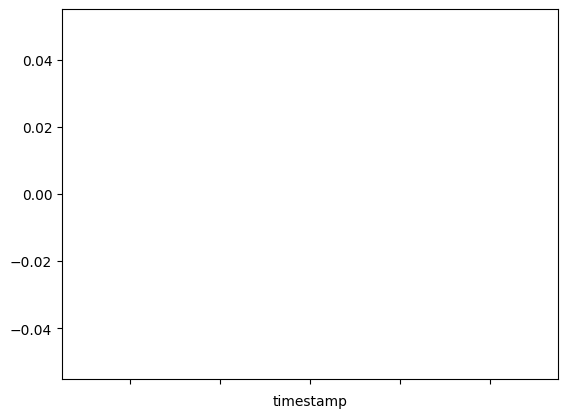

In [ ]:
df.set_index('timestamp').close.astype(float).plot()

In [ ]:
conn.close()